In [52]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras import callbacks
from tensorflow.keras.models import Sequential
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout
warnings.filterwarnings('ignore')

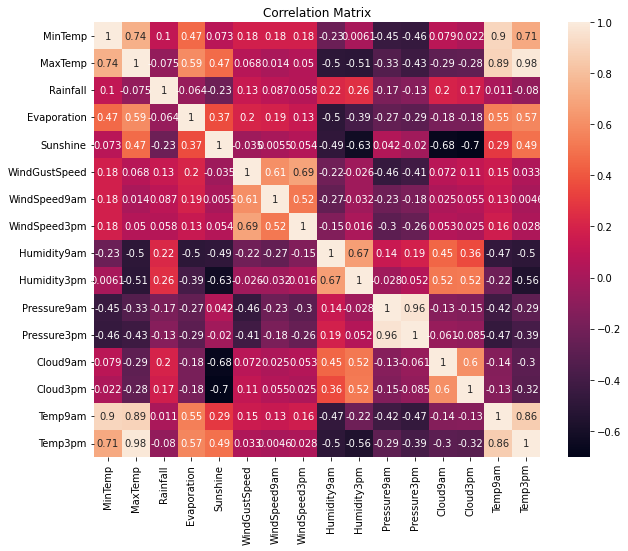

In [2]:

# Reading data from CSV file
data = pd.read_csv('data.csv')
# Creating a correlation matrix
corr_matrix = data.corr()
# Creating a bigger figure
plt.figure(figsize=(10, 8))
# Creating a heatmap of the correlation matrix
sns.heatmap(corr_matrix, annot=True)
# Adding a title to the plot
plt.title('Correlation Matrix')
# Displaying the plot
plt.show()

In [3]:
data.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [4]:
data.count()

Date             145460
Location         145460
MinTemp          143975
MaxTemp          144199
Rainfall         142199
Evaporation       82670
Sunshine          75625
WindGustDir      135134
WindGustSpeed    135197
WindDir9am       134894
WindDir3pm       141232
WindSpeed9am     143693
WindSpeed3pm     142398
Humidity9am      142806
Humidity3pm      140953
Pressure9am      130395
Pressure3pm      130432
Cloud9am          89572
Cloud3pm          86102
Temp9am          143693
Temp3pm          141851
RainToday        142199
RainTomorrow     142193
dtype: int64

In [5]:
# We are going to use just Temperature, Humidity and Precipitation so not getting any NUll value in these columns But for improving the results I"m going to drop all the Null values columns 

In [6]:
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [7]:
# list of columns with null values
cols_with_null = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']
# fill null values with the column mean for numeric columns, and mode for categorical columns
for col in cols_with_null:
    if data[col].dtype == 'object':
        data[col].fillna(data[col].mode()[0], inplace=True)
    else:
        data[col].fillna(data[col].mean(), inplace=True)

In [8]:
data.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [9]:
data.count()

Date             145460
Location         145460
MinTemp          145460
MaxTemp          145460
Rainfall         145460
Evaporation      145460
Sunshine         145460
WindGustDir      145460
WindGustSpeed    145460
WindDir9am       145460
WindDir3pm       145460
WindSpeed9am     145460
WindSpeed3pm     145460
Humidity9am      145460
Humidity3pm      145460
Pressure9am      145460
Pressure3pm      145460
Cloud9am         145460
Cloud3pm         145460
Temp9am          145460
Temp3pm          145460
RainToday        145460
RainTomorrow     145460
dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        145460 non-null  float64
 3   MaxTemp        145460 non-null  float64
 4   Rainfall       145460 non-null  float64
 5   Evaporation    145460 non-null  float64
 6   Sunshine       145460 non-null  float64
 7   WindGustDir    145460 non-null  object 
 8   WindGustSpeed  145460 non-null  float64
 9   WindDir9am     145460 non-null  object 
 10  WindDir3pm     145460 non-null  object 
 11  WindSpeed9am   145460 non-null  float64
 12  WindSpeed3pm   145460 non-null  float64
 13  Humidity9am    145460 non-null  float64
 14  Humidity3pm    145460 non-null  float64
 15  Pressure9am    145460 non-null  float64
 16  Pressure3pm    145460 non-null  float64
 17  Cloud9am       145460 non-nul

In [11]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.649940,1015.255889,4.447461,4.509930,16.990631,21.683390
std,6.365750,7.088124,8.382488,3.161541,2.729486,13.118253,8.861059,8.716581,18.854765,20.471189,6.728467,6.663973,2.265604,2.092954,6.449221,6.850057
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.700000,18.000000,0.000000,4.000000,7.611178,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,1011.100000,3.000000,4.000000,12.300000,16.700000
50%,12.100000,22.700000,0.000000,5.468232,7.611178,39.000000,13.000000,18.662657,69.000000,51.539116,1017.649940,1015.255889,4.447461,4.509930,16.800000,21.400000
75%,16.800000,28.200000,1.000000,5.468232,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,1019.400000,6.000000,6.000000,21.500000,26.200000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


In [12]:
subdivs = data['Location'].unique()
num_of_subdivs = subdivs.size
print('Total # of Locations: ' + str(num_of_subdivs))
subdivs

Total # of Locations: 49


array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

<Axes: xlabel='RainTomorrow', ylabel='count'>

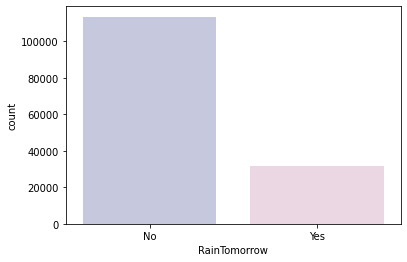

In [13]:
#first of all let us evaluate the target and find out if our data is imbalanced or not
cols= ["#C2C4E2","#EED4E5"]
sns.countplot(x= data["RainTomorrow"], palette= cols)

<Axes: >

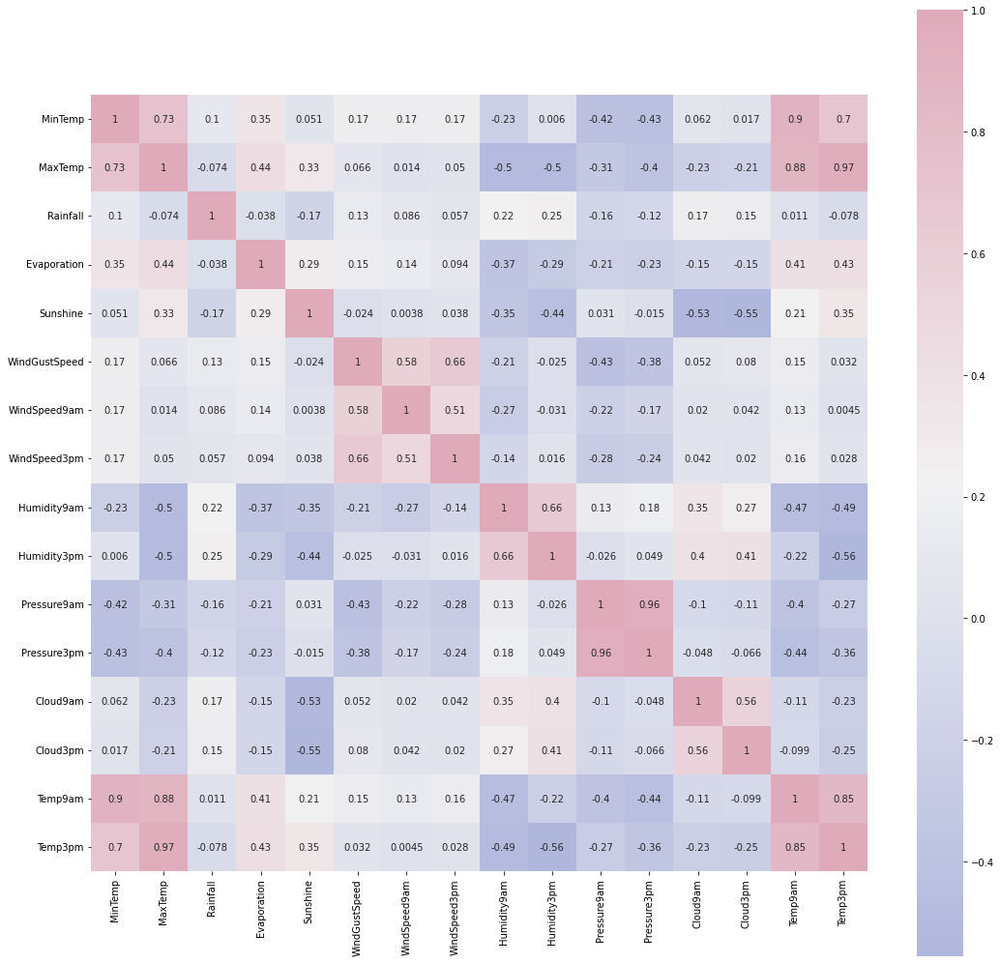

In [14]:
#  Correlation amongst numeric attributes
corrmat = data.corr()
cmap = sns.diverging_palette(260,-10,s=50, l=75, n=6, as_cmap=True)
plt.subplots(figsize=(18,18))
sns.heatmap(corrmat,cmap= cmap,annot=True, square=True)

In [15]:
#Parsing datetime
#exploring the length of date objects
lengths = data["Date"].str.len()
lengths.value_counts()

10    145460
Name: Date, dtype: int64

In [16]:
#There don't seem to be any error in dates so parsing values into datetime
data['Date']= pd.to_datetime(data["Date"])
#Creating a collumn of year
data['year'] = data.Date.dt.year

# function to encode datetime into cyclic parameters. 
#As I am planning to use this data in a neural network I prefer the months and days in a cyclic continuous feature. 

def encode(data, col, max_val):
    data[col + '_sin'] = np.sin(2 * np.pi * data[col]/max_val)
    data[col + '_cos'] = np.cos(2 * np.pi * data[col]/max_val)
    return data

data['month'] = data.Date.dt.month
data = encode(data, 'month', 12)

data['day'] = data.Date.dt.day
data = encode(data, 'day', 31)

data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Temp3pm,RainToday,RainTomorrow,year,month,month_sin,month_cos,day,day_sin,day_cos
0,2008-12-01,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,...,21.8,No,No,2008,12,-2.449294e-16,1.0,1,0.201299,0.979530
1,2008-12-02,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,...,24.3,No,No,2008,12,-2.449294e-16,1.0,2,0.394356,0.918958
2,2008-12-03,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,...,23.2,No,No,2008,12,-2.449294e-16,1.0,3,0.571268,0.820763
3,2008-12-04,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,...,26.5,No,No,2008,12,-2.449294e-16,1.0,4,0.724793,0.688967
4,2008-12-05,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,...,29.7,No,No,2008,12,-2.449294e-16,1.0,5,0.848644,0.528964


Text(0.5, 0, 'Days In Year')

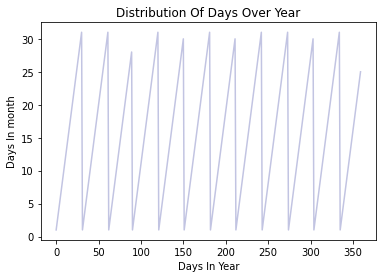

In [17]:
# roughly a year's span section 
section = data[:360] 
tm = section["day"].plot(color="#C2C4E2")
tm.set_title("Distribution Of Days Over Year")
tm.set_ylabel("Days In month")
tm.set_xlabel("Days In Year")

In [18]:
# Get list of categorical variables
s = (data.dtypes == "object")
object_cols = list(s[s].index)

print("Categorical variables:")
print(object_cols)

Categorical variables:
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


## Data transformation

In [19]:
label_encoder = LabelEncoder()
for i in object_cols:
    data[i] = label_encoder.fit_transform(data[i])
    

In [22]:

features = data.drop([ 'Date','day', 'month'], axis=1) # dropping target and extra columns


In [23]:
features.count()

Location         145460
MinTemp          145460
MaxTemp          145460
Rainfall         145460
Evaporation      145460
Sunshine         145460
WindGustDir      145460
WindGustSpeed    145460
WindDir9am       145460
WindDir3pm       145460
WindSpeed9am     145460
WindSpeed3pm     145460
Humidity9am      145460
Humidity3pm      145460
Pressure9am      145460
Pressure3pm      145460
Cloud9am         145460
Cloud3pm         145460
Temp9am          145460
Temp3pm          145460
RainToday        145460
RainTomorrow     145460
year             145460
month_sin        145460
month_cos        145460
day_sin          145460
day_cos          145460
dtype: int64

## Normalization and Standardization:

In [24]:
# Select the columns to be normalized/standardized
from sklearn.preprocessing import MinMaxScaler
col_names = list(features.columns)

# Normalize the selected columns using Min-Max Scaler
scaler_norm = MinMaxScaler()
features_Norm = scaler_norm.fit_transform(features)
features_Norm = pd.DataFrame(features, columns=col_names)

#Set up a standard scaler for the features
col_names = list(features.columns)
s_scaler = preprocessing.StandardScaler()
features_std = s_scaler.fit_transform(features)
features_std = pd.DataFrame(features, columns=col_names) 

features_std.describe().T

,count,mean,std,min,25%,50%,75%,max
Location,145460.0,23.793524,14.228687,0.000000,11.000000,2.400000e+01,36.000000,48.000000
MinTemp,145460.0,12.194034,6.365750,-8.500000,7.700000,1.210000e+01,16.800000,33.900000
MaxTemp,145460.0,23.221348,7.088124,-4.800000,18.000000,2.270000e+01,28.200000,48.100000
Rainfall,145460.0,2.360918,8.382488,0.000000,0.000000,0.000000e+00,1.000000,371.000000
Evaporation,145460.0,5.468232,3.161541,0.000000,4.000000,5.468232e+00,5.468232,145.000000
Sunshine,145460.0,7.611178,2.729486,0.000000,7.611178,7.611178e+00,8.700000,14.500000
WindGustDir,145460.0,8.093600,4.694110,0.000000,4.000000,9.000000e+00,13.000000,15.000000
WindGustSpeed,145460.0,40.035230,13.118253,6.000000,31.000000,3.900000e+01,46.000000,135.000000
WindDir9am,145460.0,6.999526,4.515839,0.000000,3.000000,7.000000e+00,11.000000,15.000000
WindDir3pm,145460.0,7.798852,4.538135,0.000000,4.000000,8.000000e+00,12.000000,15.000000


In [25]:
features_std.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month_sin,month_cos,day_sin,day_cos
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.00000,145460.000000,145460.000000,145460.000000,...,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,1.454600e+05,1.454600e+05,1.454600e+05,145460.000000
mean,23.793524,12.194034,23.221348,2.360918,5.468232,7.611178,8.09360,40.035230,6.999526,7.798852,...,4.509930,16.990631,21.683390,0.219167,0.219146,2012.769751,1.158393e-02,-1.635591e-02,2.281439e-03,-0.019380
std,14.228687,6.365750,7.088124,8.382488,3.161541,2.729486,4.69411,13.118253,4.515839,4.538135,...,2.092954,6.449221,6.850057,0.413683,0.413669,2.537684,7.052668e-01,7.086635e-01,7.134009e-01,0.700489
min,0.000000,-8.500000,-4.800000,0.000000,0.000000,0.000000,0.00000,6.000000,0.000000,0.000000,...,0.000000,-7.200000,-5.400000,0.000000,0.000000,2007.000000,-1.000000e+00,-1.000000e+00,-9.987165e-01,-0.994869
25%,11.000000,7.700000,18.000000,0.000000,4.000000,7.611178,4.00000,31.000000,3.000000,4.000000,...,4.000000,12.300000,16.700000,0.000000,0.000000,2011.000000,-5.000000e-01,-8.660254e-01,-7.247928e-01,-0.758758
50%,24.000000,12.100000,22.700000,0.000000,5.468232,7.611178,9.00000,39.000000,7.000000,8.000000,...,4.509930,16.800000,21.400000,0.000000,0.000000,2013.000000,1.224647e-16,-1.836970e-16,-2.449294e-16,-0.050649
75%,36.000000,16.800000,28.200000,1.000000,5.468232,8.700000,13.00000,46.000000,11.000000,12.000000,...,6.000000,21.500000,26.200000,0.000000,0.000000,2015.000000,5.000000e-01,5.000000e-01,7.247928e-01,0.688967
max,48.000000,33.900000,48.100000,371.000000,145.000000,14.500000,15.00000,135.000000,15.000000,15.000000,...,9.000000,40.200000,46.700000,1.000000,1.000000,2017.000000,1.000000e+00,1.000000e+00,9.987165e-01,1.000000


In [26]:
features_Norm.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month_sin,month_cos,day_sin,day_cos
count,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.00000,145460.000000,145460.000000,145460.000000,...,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,145460.000000,1.454600e+05,1.454600e+05,1.454600e+05,145460.000000
mean,23.793524,12.194034,23.221348,2.360918,5.468232,7.611178,8.09360,40.035230,6.999526,7.798852,...,4.509930,16.990631,21.683390,0.219167,0.219146,2012.769751,1.158393e-02,-1.635591e-02,2.281439e-03,-0.019380
std,14.228687,6.365750,7.088124,8.382488,3.161541,2.729486,4.69411,13.118253,4.515839,4.538135,...,2.092954,6.449221,6.850057,0.413683,0.413669,2.537684,7.052668e-01,7.086635e-01,7.134009e-01,0.700489
min,0.000000,-8.500000,-4.800000,0.000000,0.000000,0.000000,0.00000,6.000000,0.000000,0.000000,...,0.000000,-7.200000,-5.400000,0.000000,0.000000,2007.000000,-1.000000e+00,-1.000000e+00,-9.987165e-01,-0.994869
25%,11.000000,7.700000,18.000000,0.000000,4.000000,7.611178,4.00000,31.000000,3.000000,4.000000,...,4.000000,12.300000,16.700000,0.000000,0.000000,2011.000000,-5.000000e-01,-8.660254e-01,-7.247928e-01,-0.758758
50%,24.000000,12.100000,22.700000,0.000000,5.468232,7.611178,9.00000,39.000000,7.000000,8.000000,...,4.509930,16.800000,21.400000,0.000000,0.000000,2013.000000,1.224647e-16,-1.836970e-16,-2.449294e-16,-0.050649
75%,36.000000,16.800000,28.200000,1.000000,5.468232,8.700000,13.00000,46.000000,11.000000,12.000000,...,6.000000,21.500000,26.200000,0.000000,0.000000,2015.000000,5.000000e-01,5.000000e-01,7.247928e-01,0.688967
max,48.000000,33.900000,48.100000,371.000000,145.000000,14.500000,15.00000,135.000000,15.000000,15.000000,...,9.000000,40.200000,46.700000,1.000000,1.000000,2017.000000,1.000000e+00,1.000000e+00,9.987165e-01,1.000000


# #Data validation

Null values: Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
year             0
month_sin        0
month_cos        0
day_sin          0
day_cos          0
dtype: int64
Duplicates: 0
Data types: Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm  

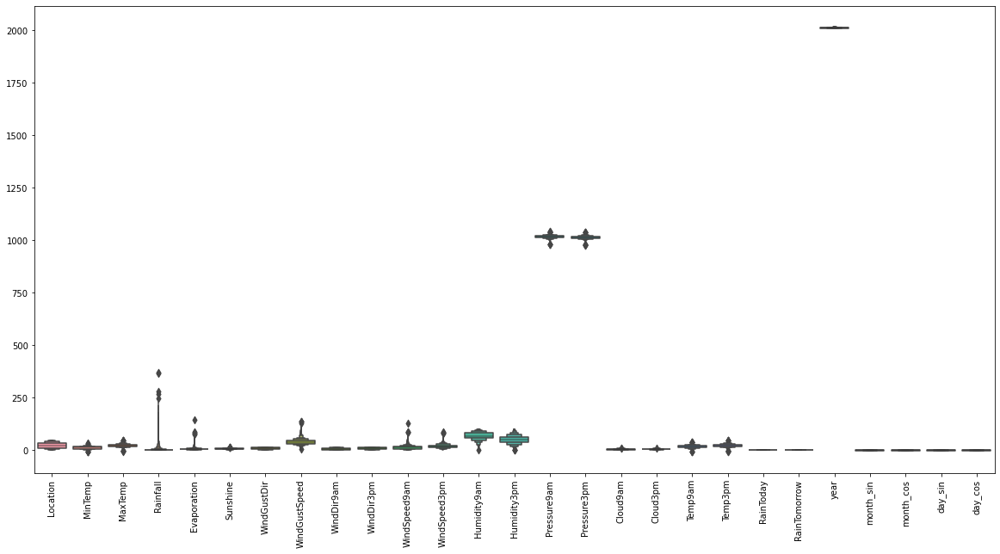

In [27]:
# Check for null values
null_values = features_Norm.isnull().sum()
print('Null values:', null_values)

# Check for duplicates
duplicates = features_Norm.duplicated().sum()
print('Duplicates:', duplicates)

# Check data types
print('Data types:', features_Norm.dtypes)

# Check for outliers using box plots
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
sns.boxenplot(data = features_std)
plt.xticks(rotation=90)
plt.show()

In [28]:
temp = features_std

target = features_std['RainTomorrow']
features_std = features_std.drop(['RainTomorrow'], axis=1) # dropping target and extra columns

In [29]:
features_std

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,year,month_sin,month_cos,day_sin,day_cos
0,2,13.4,22.900000,0.6,5.468232,7.611178,13,44.00000,13,14,...,8.000000,4.50993,16.9,21.8,0,2008,-2.449294e-16,1.0,0.201299,0.979530
1,2,7.4,25.100000,0.0,5.468232,7.611178,14,44.00000,6,15,...,4.447461,4.50993,17.2,24.3,0,2008,-2.449294e-16,1.0,0.394356,0.918958
2,2,12.9,25.700000,0.0,5.468232,7.611178,15,46.00000,13,15,...,4.447461,2.00000,21.0,23.2,0,2008,-2.449294e-16,1.0,0.571268,0.820763
3,2,9.2,28.000000,0.0,5.468232,7.611178,4,24.00000,9,0,...,4.447461,4.50993,18.1,26.5,0,2008,-2.449294e-16,1.0,0.724793,0.688967
4,2,17.5,32.300000,1.0,5.468232,7.611178,13,41.00000,1,7,...,7.000000,8.00000,17.8,29.7,0,2008,-2.449294e-16,1.0,0.848644,0.528964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,41,2.8,23.400000,0.0,5.468232,7.611178,0,31.00000,9,1,...,4.447461,4.50993,10.1,22.4,0,2017,1.224647e-16,-1.0,-0.897805,-0.440394
145456,41,3.6,25.300000,0.0,5.468232,7.611178,6,22.00000,9,3,...,4.447461,4.50993,10.9,24.5,0,2017,1.224647e-16,-1.0,-0.968077,-0.250653
145457,41,5.4,26.900000,0.0,5.468232,7.611178,3,37.00000,9,14,...,4.447461,4.50993,12.5,26.1,0,2017,1.224647e-16,-1.0,-0.998717,-0.050649
145458,41,7.8,27.000000,0.0,5.468232,7.611178,9,28.00000,10,3,...,3.000000,2.00000,15.1,26.0,0,2017,1.224647e-16,-1.0,-0.988468,0.151428


In [30]:
# Calculate the IQR for each variable
q1 = features_std.quantile(0.25)
q3 = features_std.quantile(0.75)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Create a boolean mask to identify outliers
outliers_mask = (features_std < lower_bound) | (features_std > upper_bound)

# Remove outliers from the dataset
features_std = features_std[~outliers_mask.any(axis=1)]


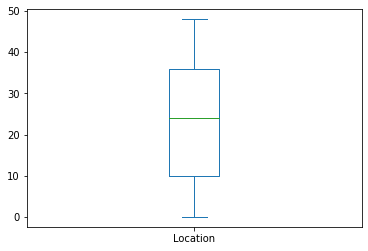

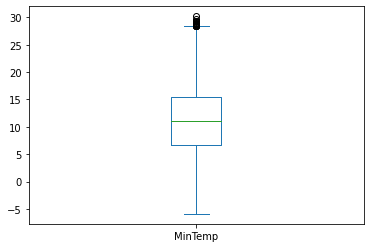

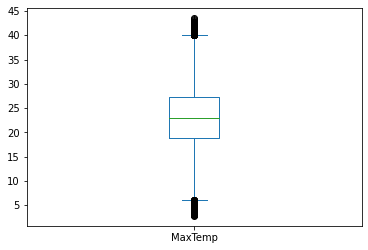

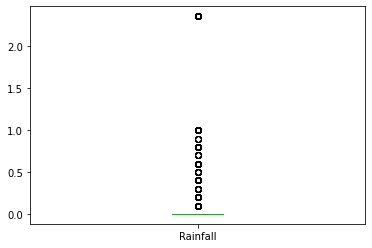

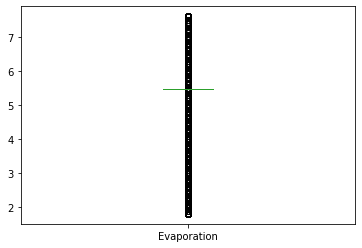

...

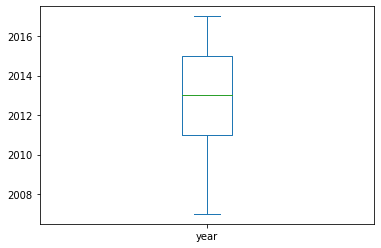

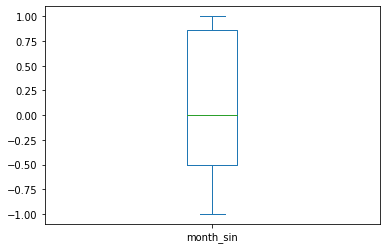

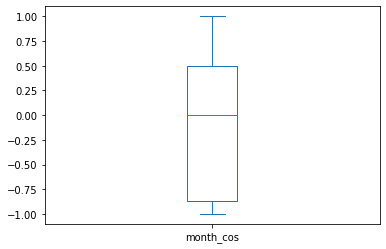

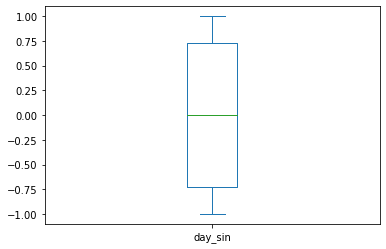

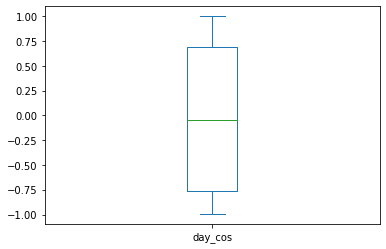

In [31]:
for i in features_std:    
    features_std[i].plot(kind='box')
    plt.show()

In [32]:
features_std.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,year,month_sin,month_cos,day_sin,day_cos
count,62826.000000,62826.000000,62826.000000,62826.000000,62826.000000,62826.000000,62826.000000,62826.000000,62826.000000,62826.00000,...,62826.000000,62826.000000,62826.000000,62826.000000,62826.0,62826.000000,6.282600e+04,6.282600e+04,6.282600e+04,62826.000000
mean,23.929472,11.083944,23.189272,0.154320,5.133210,7.859148,7.991182,36.971614,6.849744,7.55251,...,4.407608,4.490633,16.378792,21.693463,0.0,2013.078312,3.096527e-02,-6.370340e-02,6.205352e-03,-0.019800
std,14.664398,6.163367,6.269338,0.459419,1.046188,0.757910,4.639537,10.581573,4.431403,4.43900,...,1.834456,1.615598,5.945963,6.015108,0.0,2.547337,7.138866e-01,6.966813e-01,7.128423e-01,0.701029
min,0.000000,-5.900000,2.800000,0.000000,1.800000,6.000000,0.000000,9.000000,0.000000,0.00000,...,0.000000,1.000000,-1.400000,2.500000,0.0,2007.000000,-1.000000e+00,-1.000000e+00,-9.987165e-01,-0.994869
25%,10.000000,6.700000,18.800000,0.000000,5.468232,7.611178,4.000000,30.000000,3.000000,4.00000,...,4.447461,4.509930,12.300000,17.600000,0.0,2011.000000,-5.000000e-01,-8.660254e-01,-7.247928e-01,-0.758758
50%,24.000000,11.000000,22.900000,0.000000,5.468232,7.611178,8.000000,37.000000,7.000000,8.00000,...,4.447461,4.509930,16.400000,21.500000,0.0,2013.000000,1.224647e-16,-1.836970e-16,-2.449294e-16,-0.050649
75%,36.000000,15.400000,27.300000,0.000000,5.468232,7.611178,13.000000,43.000000,10.000000,11.00000,...,4.447461,4.509930,20.500000,25.500000,0.0,2015.000000,8.660254e-01,5.000000e-01,7.247928e-01,0.688967
max,48.000000,30.200000,43.500000,2.360918,7.600000,10.300000,15.000000,67.000000,15.000000,15.00000,...,9.000000,8.000000,35.100000,40.400000,0.0,2017.000000,1.000000e+00,1.000000e+00,9.987165e-01,1.000000


In [33]:
features_std.count()

Location         62826
MinTemp          62826
MaxTemp          62826
Rainfall         62826
Evaporation      62826
Sunshine         62826
WindGustDir      62826
WindGustSpeed    62826
WindDir9am       62826
WindDir3pm       62826
WindSpeed9am     62826
WindSpeed3pm     62826
Humidity9am      62826
Humidity3pm      62826
Pressure9am      62826
Pressure3pm      62826
Cloud9am         62826
Cloud3pm         62826
Temp9am          62826
Temp3pm          62826
RainToday        62826
year             62826
month_sin        62826
month_cos        62826
day_sin          62826
day_cos          62826
dtype: int64

In [34]:
features_std.to_csv('clean_data.csv', index=False)

# Assignment 3

In [124]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

In [125]:
df = pd.read_csv('clean_data.csv')

In [126]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,year,month_sin,month_cos,day_sin,day_cos
0,2,13.4,22.900000,0.6,5.468232,7.611178,13,44.00000,13,14,...,8.000000,4.50993,16.9,21.8,0,2008,-2.449294e-16,1.0,0.201299,0.979530
1,2,7.4,25.100000,0.0,5.468232,7.611178,14,44.00000,6,15,...,4.447461,4.50993,17.2,24.3,0,2008,-2.449294e-16,1.0,0.394356,0.918958
2,2,12.9,25.700000,0.0,5.468232,7.611178,15,46.00000,13,15,...,4.447461,2.00000,21.0,23.2,0,2008,-2.449294e-16,1.0,0.571268,0.820763
3,2,9.2,28.000000,0.0,5.468232,7.611178,4,24.00000,9,0,...,4.447461,4.50993,18.1,26.5,0,2008,-2.449294e-16,1.0,0.724793,0.688967
4,2,17.5,32.300000,1.0,5.468232,7.611178,13,41.00000,1,7,...,7.000000,8.00000,17.8,29.7,0,2008,-2.449294e-16,1.0,0.848644,0.528964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62821,41,2.8,23.400000,0.0,5.468232,7.611178,0,31.00000,9,1,...,4.447461,4.50993,10.1,22.4,0,2017,1.224647e-16,-1.0,-0.897805,-0.440394
62822,41,3.6,25.300000,0.0,5.468232,7.611178,6,22.00000,9,3,...,4.447461,4.50993,10.9,24.5,0,2017,1.224647e-16,-1.0,-0.968077,-0.250653
62823,41,5.4,26.900000,0.0,5.468232,7.611178,3,37.00000,9,14,...,4.447461,4.50993,12.5,26.1,0,2017,1.224647e-16,-1.0,-0.998717,-0.050649
62824,41,7.8,27.000000,0.0,5.468232,7.611178,9,28.00000,10,3,...,3.000000,2.00000,15.1,26.0,0,2017,1.224647e-16,-1.0,-0.988468,0.151428


## Univariate Analysis:

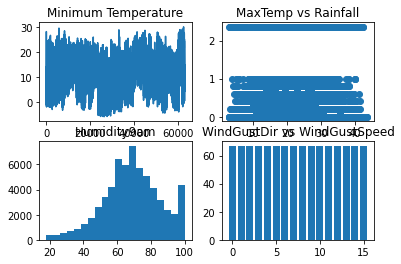

In [127]:
fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(df['MinTemp'])
axs[0, 0].set_title('Minimum Temperature')
axs[0, 1].scatter(df['MaxTemp'], df['Rainfall'])
axs[0, 1].set_title('MaxTemp vs Rainfall')
axs[1, 0].hist(df['Humidity9am'], bins=20)
axs[1, 0].set_title('Humidity9am')
axs[1, 1].bar(df['WindGustDir'], df['WindGustSpeed'])
axs[1, 1].set_title('WindGustDir vs WindGustSpeed')
plt.show()

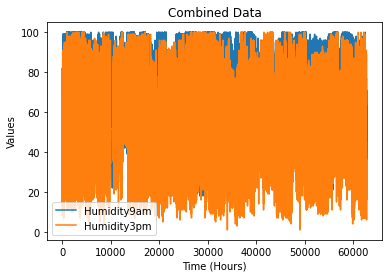

In [128]:
# Combining data into a single graph of Humidity9am and Humidity3pm 
plt.plot(df['Humidity9am'], label='Humidity9am')
plt.plot(df['Humidity3pm'], label='Humidity3pm')
plt.title('Combined Data')
plt.xlabel('Time (Hours)')
plt.ylabel('Values')
plt.legend()
plt.show()

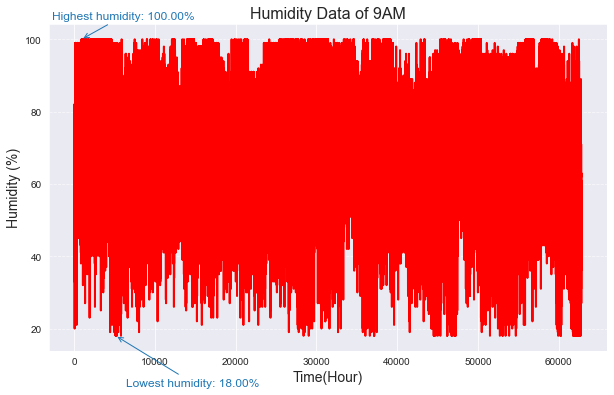

In [129]:
# Set the style of the plot
sns.set_style('darkgrid')

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the humidity data
ax.plot(df['Humidity9am'], color='red', linewidth=2)

# Set the axis labels and title
ax.set_xlabel('Time(Hour)', fontsize=14)
ax.set_ylabel('Humidity (%)', fontsize=14)
ax.set_title('Humidity Data of 9AM', fontsize=16)

# Add a horizontal grid line
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add text annotations for the highest and lowest humidity values
max_humidity = df['Humidity9am'].max()
min_humidity = df['Humidity9am'].min()
ax.annotate(f'Highest humidity: {max_humidity:.2f}%', xy=(df['Humidity9am'].idxmax(), max_humidity),
            xytext=(-30, 20), textcoords='offset points', fontsize=12, color='#1f77b4',
            arrowprops=dict(arrowstyle='->', color='#1f77b4'))
ax.annotate(f'Lowest humidity: {min_humidity:.2f}%', xy=(df['Humidity9am'].idxmin(), min_humidity),
            xytext=(+10, -50), textcoords='offset points', fontsize=12, color='#1f77b4',
            arrowprops=dict(arrowstyle='->', color='#1f77b4'))

# Show the plot
plt.show()

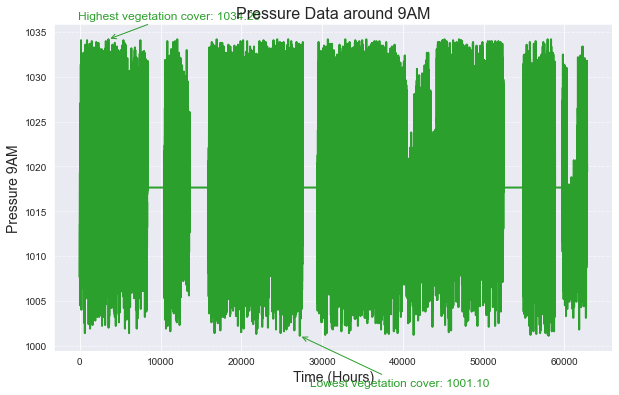

In [130]:
# Set the style of the plot
sns.set_style('darkgrid')

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the vegetation cover data
ax.plot(df['Pressure9am'], color='#2ca02c', linewidth=2)

# Set the axis labels and title
ax.set_xlabel('Time (Hours)', fontsize=14)
ax.set_ylabel('Pressure 9AM', fontsize=14)
ax.set_title('Pressure Data around 9AM', fontsize=16)

# Add a horizontal grid line
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add text annotations for the highest and lowest vegetation cover values
max_veg = df['Pressure9am'].max()
min_veg = df['Pressure9am'].min()
ax.annotate(f'Highest vegetation cover: {max_veg:.2f}', xy=(df['Pressure9am'].idxmax(), max_veg),
            xytext=(-30, 20), textcoords='offset points', fontsize=12, color='#2ca02c',
            arrowprops=dict(arrowstyle='->', color='#2ca02c'))
ax.annotate(f'Lowest vegetation cover: {min_veg:.2f}', xy=(df['Pressure9am'].idxmin(), min_veg),
            xytext=(+10, -50), textcoords='offset points', fontsize=12, color='#2ca02c',
            arrowprops=dict(arrowstyle='->', color='#2ca02c'))

# Show the plot
plt.show()

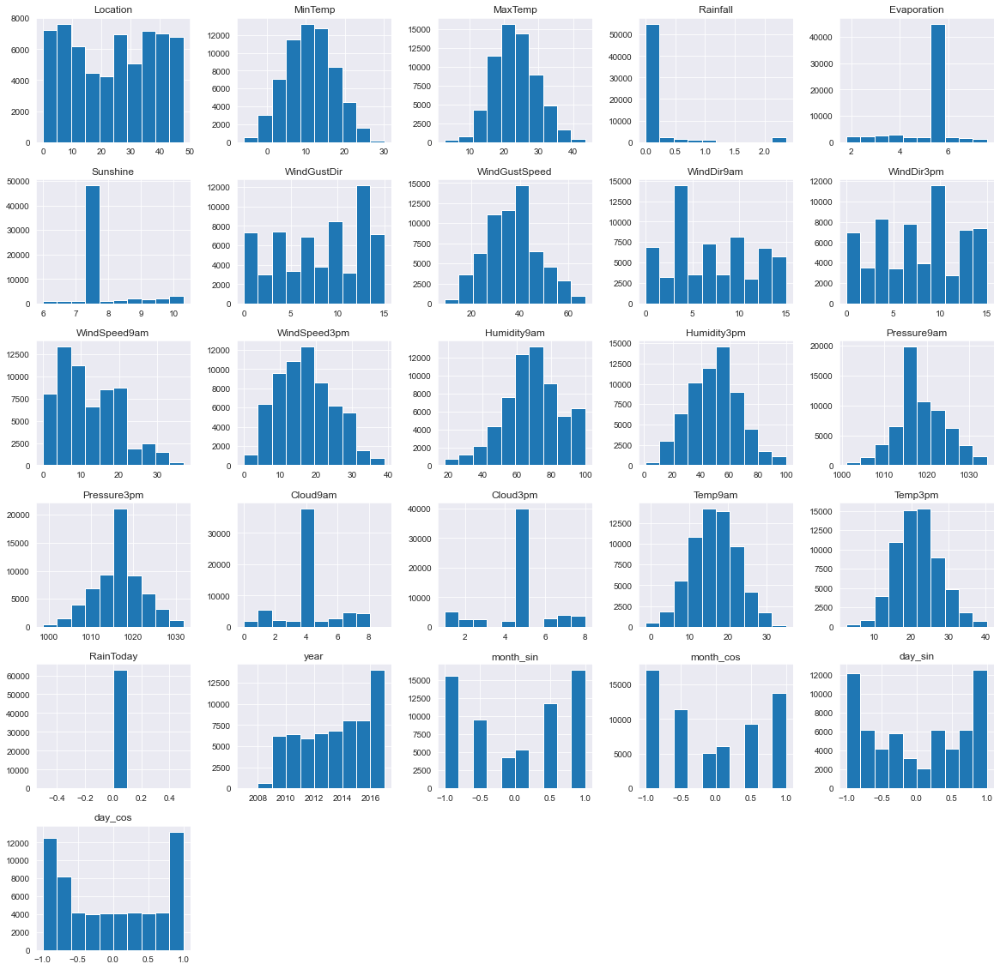

In [131]:
df.hist(figsize=(20, 20))
plt.show()

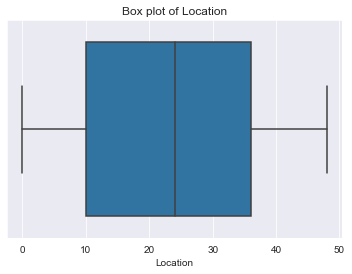

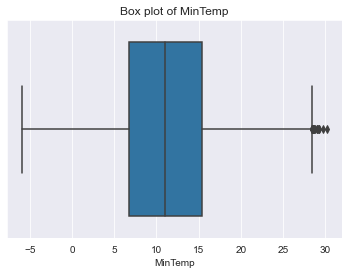

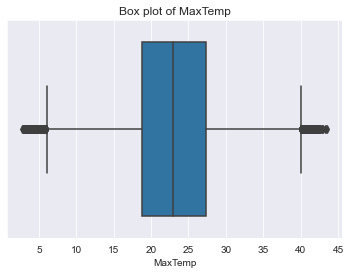

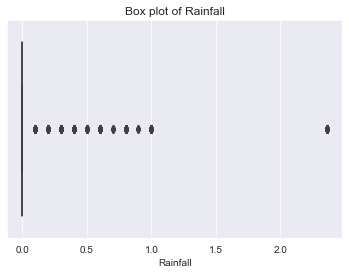

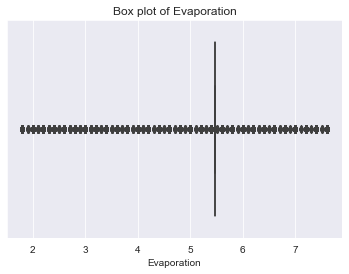

...

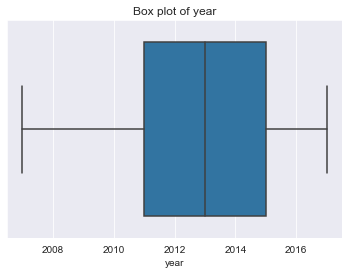

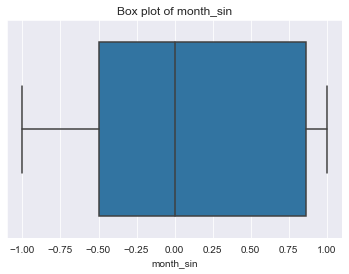

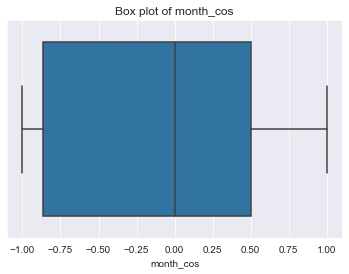

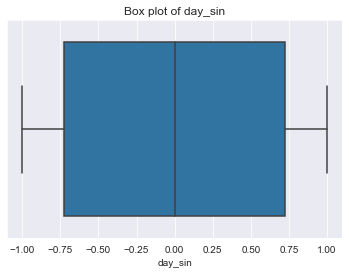

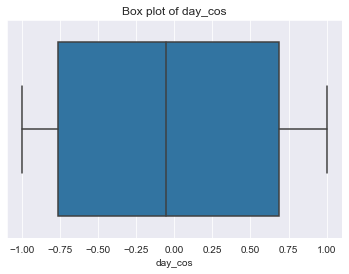

In [132]:
for column in df.columns:
    plt.figure()
    sns.boxplot(data=df, x=column)
    plt.title(f'Box plot of {column}')
    plt.show()

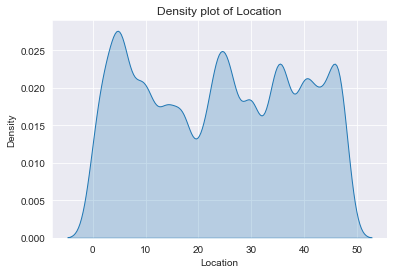

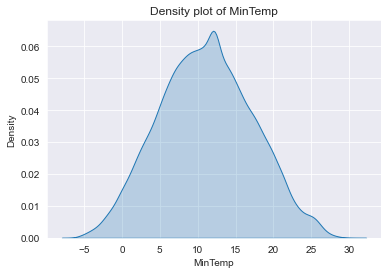

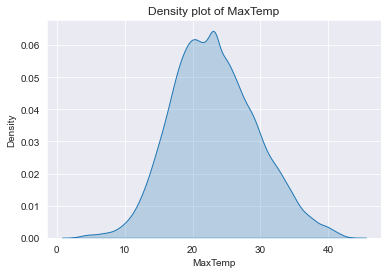

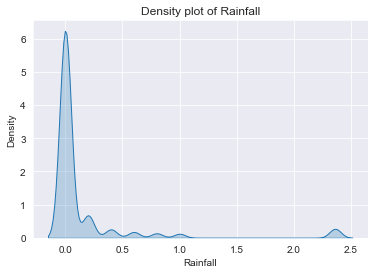

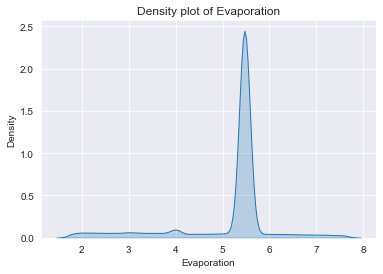

...

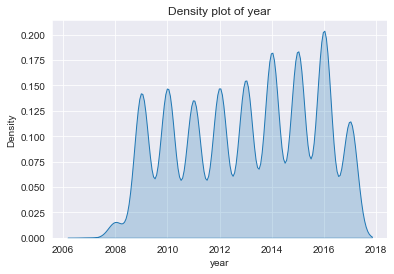

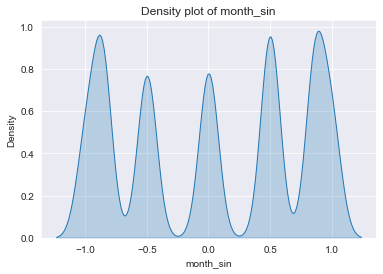

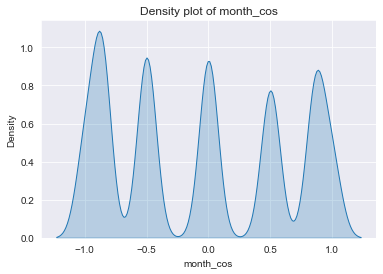

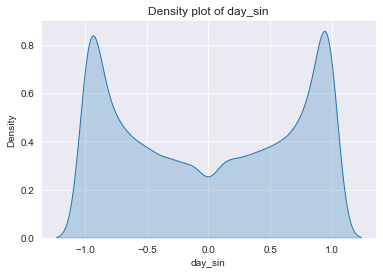

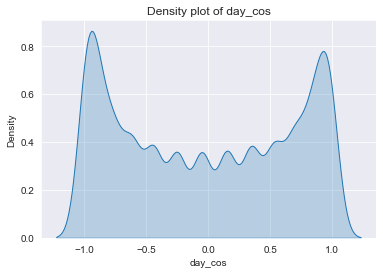

In [133]:
for column in df.columns:
    plt.figure()
    sns.kdeplot(data=df, x=column, shade=True)
    plt.title(f'Density plot of {column}')
    plt.show()

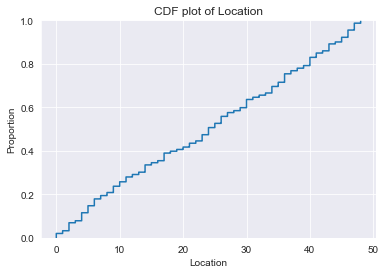

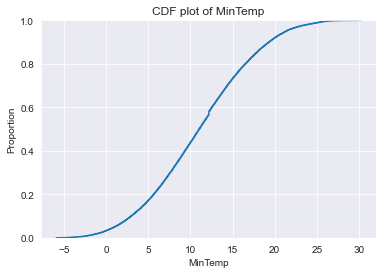

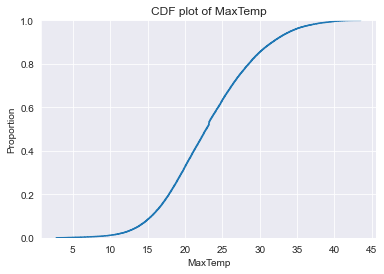

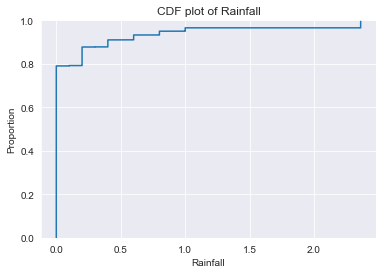

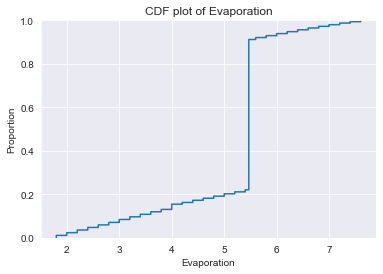

...

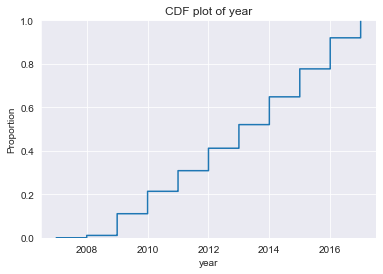

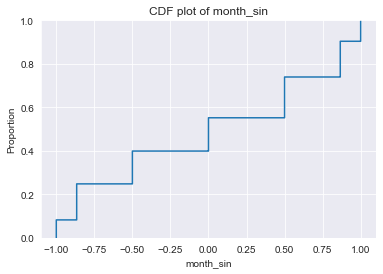

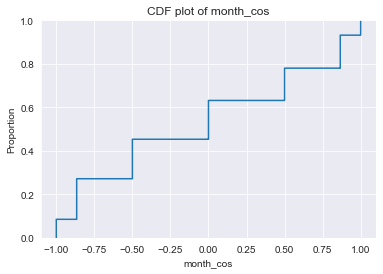

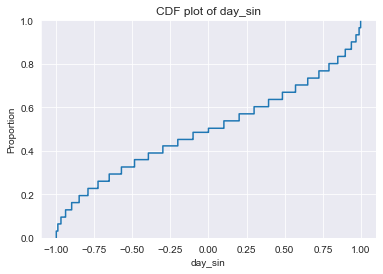

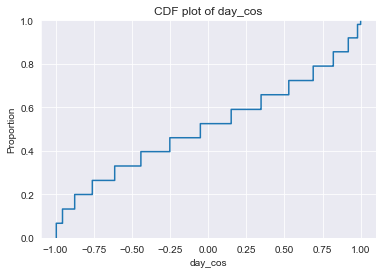

In [135]:
for column in df.columns:
    plt.figure()
    sns.ecdfplot(data=df, x=column)
    plt.title(f'CDF plot of {column}')
    plt.show()

## Bivariate Analysis:

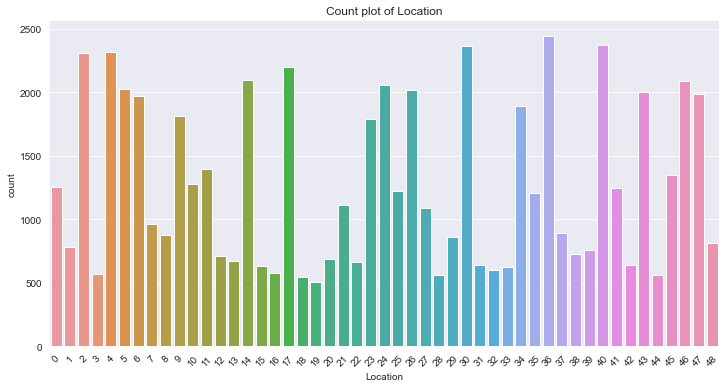

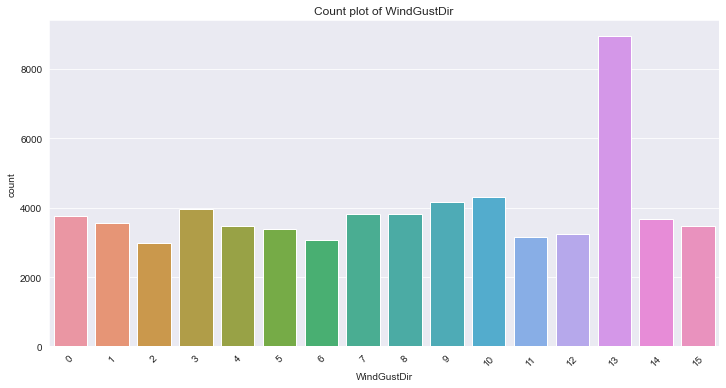

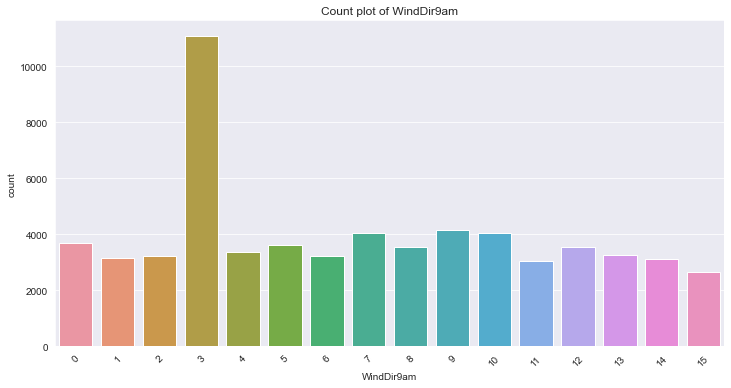

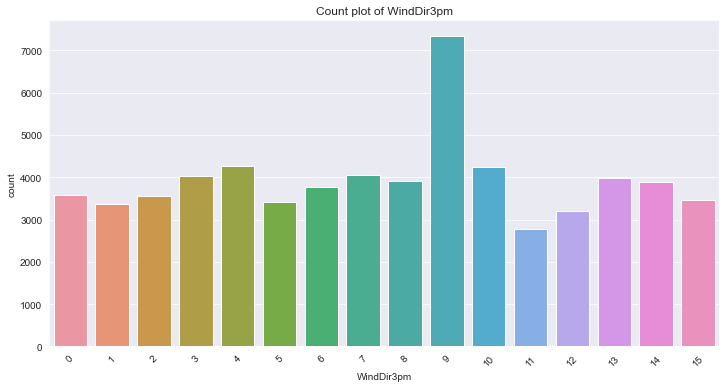

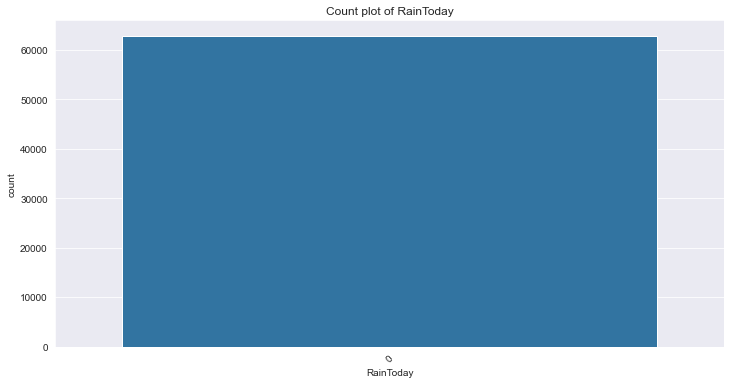

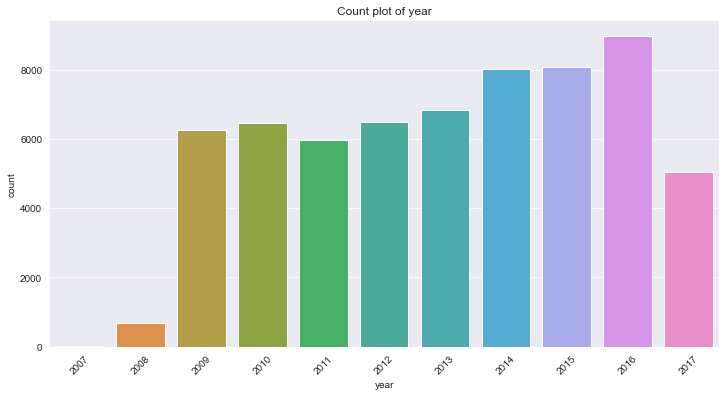

In [136]:
categorical_columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'year']
for column in categorical_columns:
    plt.figure(figsize=(12, 6))
    sns.countplot(data=df, x=column)
    plt.title(f'Count plot of {column}')
    plt.xticks(rotation=45)
    plt.show()

## Bivariate Analysis

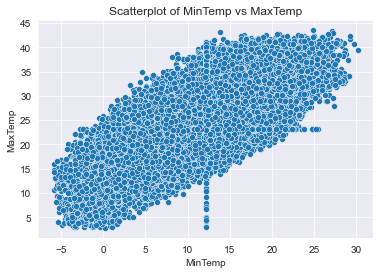

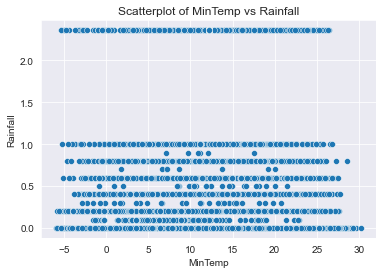

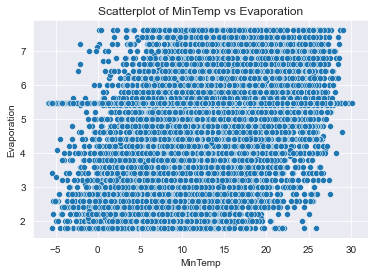

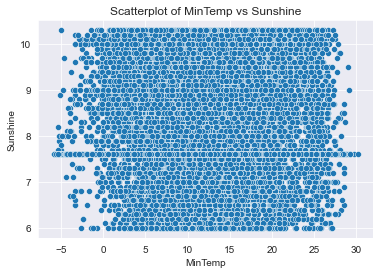

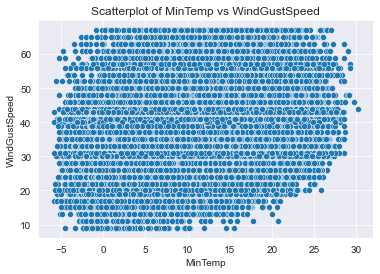

...

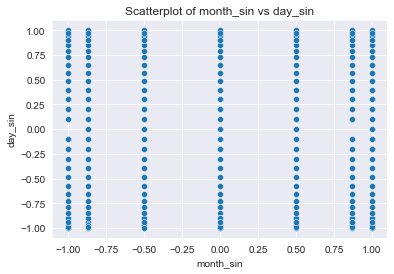

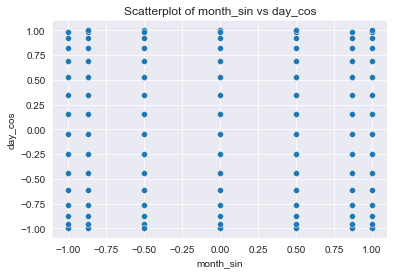

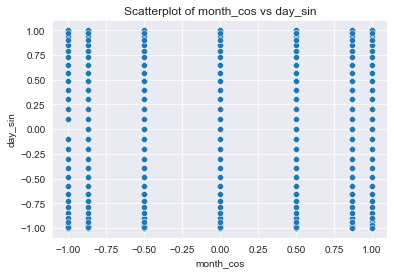

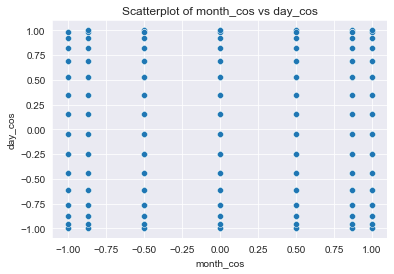

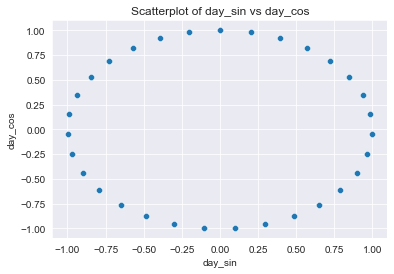

In [137]:
# List of continuous variables
continuous_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'month_sin', 'month_cos', 'day_sin', 'day_cos']

# Create scatterplots for pairs of continuous variables
for i in range(len(continuous_columns)):
    for j in range(i + 1, len(continuous_columns)):
        plt.figure()
        sns.scatterplot(data=df, x=continuous_columns[i], y=continuous_columns[j])
        plt.title(f'Scatterplot of {continuous_columns[i]} vs {continuous_columns[j]}')
        plt.show()

In [138]:
# Compute the correlation matrix
correlation_matrix = df[continuous_columns].corr()

# Display the correlation matrix
print(correlation_matrix)

                MinTemp   MaxTemp  Rainfall  Evaporation  Sunshine  \
MinTemp        1.000000  0.718153  0.051345     0.215898  0.020686   
MaxTemp        0.718153  1.000000 -0.060084     0.213605  0.044206   
Rainfall       0.051345 -0.060084  1.000000     0.021306 -0.053569   
Evaporation    0.215898  0.213605  0.021306     1.000000 -0.189259   
Sunshine       0.020686  0.044206 -0.053569    -0.189259  1.000000   
WindGustSpeed  0.221158  0.142123  0.052302     0.088272 -0.023751   
WindSpeed9am   0.195715  0.020117  0.066149     0.030002  0.028351   
WindSpeed3pm   0.209499  0.084668  0.039234     0.054331  0.042331   
Humidity9am   -0.212028 -0.377684  0.109718    -0.093232 -0.081991   
Humidity3pm    0.097886 -0.405573  0.129075     0.019382 -0.106568   
Pressure9am   -0.427465 -0.373544 -0.038461    -0.201699  0.066000   
Pressure3pm   -0.414186 -0.433318 -0.013850    -0.191143  0.046032   
Cloud9am       0.090912 -0.059666  0.084294     0.172739 -0.281281   
Cloud3pm       0.021

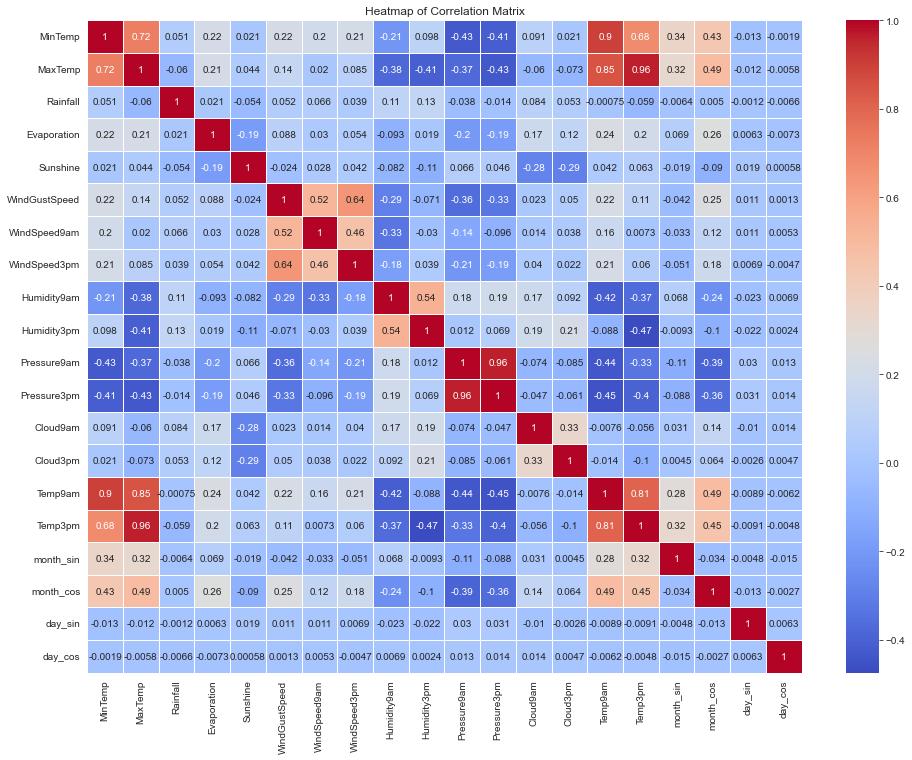

In [139]:
# Create a heat map of the correlation matrix
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Correlation Matrix')
plt.show()

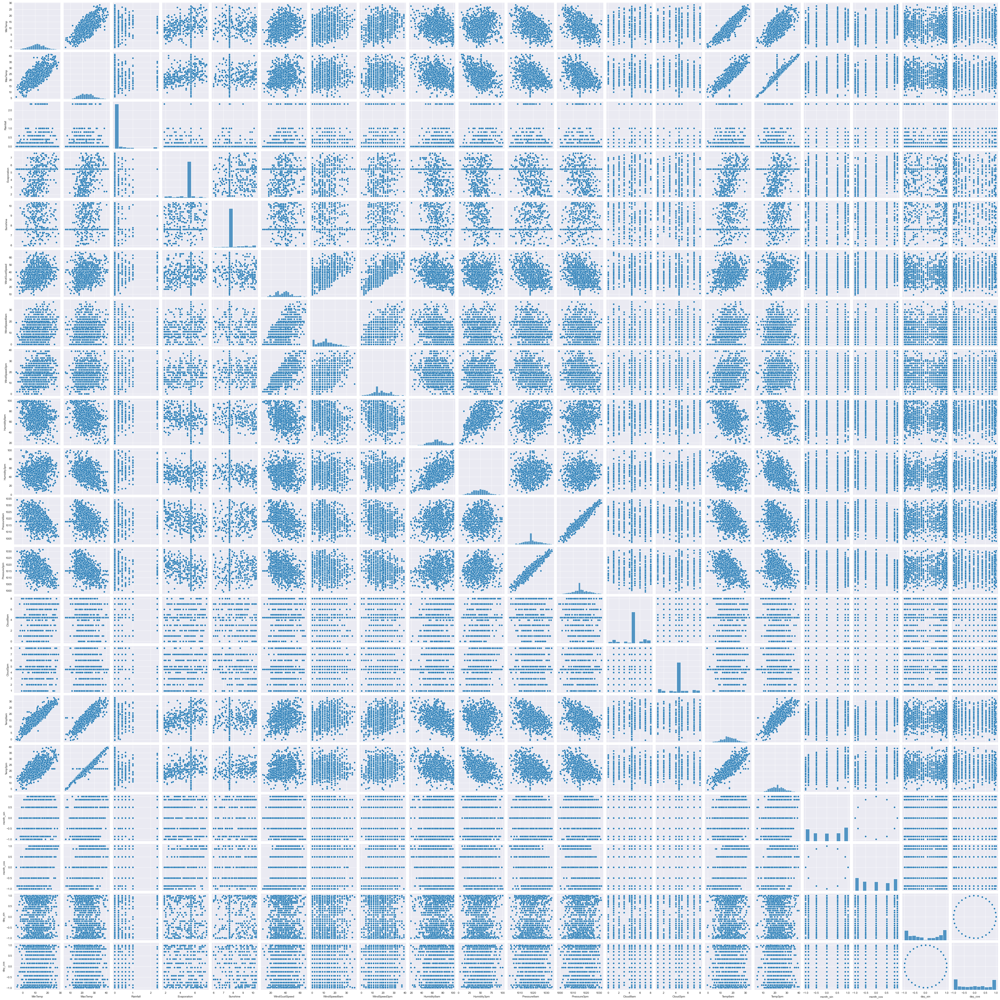

In [140]:
# Create pair plots for the continuous variables
sns.pairplot(df[continuous_columns].sample(1000))  # Use a sample of the data to speed up rendering
plt.show()

## Multivariate Analysis: 

In [141]:
# Clustering: Group similar data points together using clustering algorithms like K-means or hierarchical clustering. We can visualize the clusters using scatterplots or pair plots.

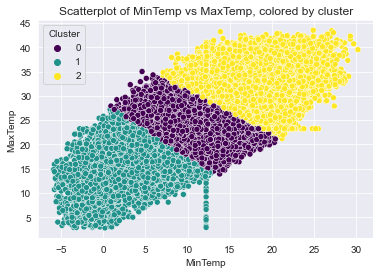

KeyboardInterrupt: 

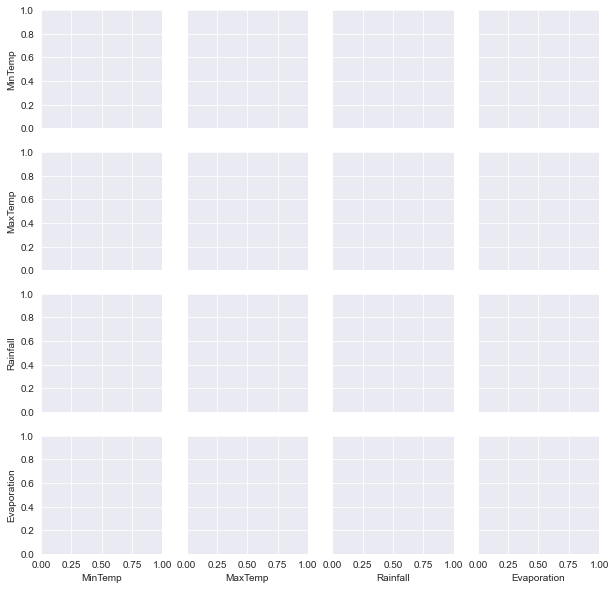

In [142]:
from sklearn.cluster import KMeans

# Choose a subset of continuous variables for clustering
selected_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation']

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[selected_columns])

# Visualize the clusters using scatterplots
sns.scatterplot(data=df, x='MinTemp', y='MaxTemp', hue='Cluster', palette='viridis')
plt.title('Scatterplot of MinTemp vs MaxTemp, colored by cluster')
plt.show()

# Visualize the clusters using pair plots
sns.pairplot(df[selected_columns + ['Cluster']].sample(1000), hue='Cluster', palette='viridis')  # Use a sample of the data to speed up rendering
plt.show()

In [ ]:
# Principal Component Analysis (PCA): Reduce the dimensionality of the dataset by projecting it onto a lower-dimensional space using PCA. we can visualize the principal components using scatterplots.

In [ ]:
# Perform PCA on the continuous variables
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df[continuous_columns])

# Create a DataFrame for the principal components
df_pca = pd.DataFrame(data=principal_components, columns=['Principal Component 1', 'Principal Component 2'])

# Visualize the principal components using a scatterplot
sns.scatterplot(data=df_pca, x='Principal Component 1', y='Principal Component 2')
plt.title('Scatterplot of Principal Components')
plt.show()

In [ ]:
# Factor Analysis: Identify latent variables or factors that explain the observed correlations among a set of variables using factor analysis. We can visualize the factor loadings using heatmaps

In [ ]:
from sklearn.decomposition import FactorAnalysis
# Perform Factor Analysis on the continuous variables
factor_analysis = FactorAnalysis(n_components=2, random_state=42)
factor_loadings = factor_analysis.fit_transform(df[continuous_columns])

# Create a DataFrame for the factor loadings
df_factors = pd.DataFrame(data=factor_analysis.components_.T, index=continuous_columns, columns=['Factor 1', 'Factor 2'])

# Visualize the factor loadings using a heatmap
plt.figure(figsize=(6, 10))
sns.heatmap(df_factors, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Factor Loadings')
plt.show()

In [ ]:
# t-Distributed Stochastic Neighbor Embedding (t-SNE): t-SNE is a dimensionality reduction technique that is particularly useful for visualizing high-dimensional data. we can use t-SNE to create 2D or 3D plots of our data. python


In [ ]:
from sklearn.manifold import TSNE

# Perform t-SNE on the continuous variables
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(df[continuous_columns])

# Create a DataFrame for the t-SNE results
df_tsne = pd.DataFrame(data=tsne_results, columns=['t-SNE 1', 't-SNE 2'])

# Visualize the t-SNE results using a scatterplot
sns.scatterplot(data=df_tsne, x='t-SNE 1', y='t-SNE 2')
plt.title('Scatterplot of t-SNE Results')
plt.show()

In [ ]:
# Parallel Coordinates Plot: This plot is useful for visualizing the relationships between multiple continuous variables. we can use a categorical variable to color the lines representing data points.

In [ ]:
from pandas.plotting import parallel_coordinates

# Choose a subset of continuous variables for the plot
selected_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine']

# Create a DataFrame containing the selected columns and a categorical variable for coloring
df_parallel = df[selected_columns + ['RainToday']]

# Plot the parallel coordinates plot
plt.figure(figsize=(12, 6))
parallel_coordinates(df_parallel.sample(1000), 'RainToday', colormap='viridis')  # Use a sample of the data to avoid overcrowding
plt.title('Parallel Coordinates Plot')
plt.show()

In [ ]:
# ndrews Curves: These curves visualize the relationships between multiple continuous variables using a Fourier series. we can use a categorical variable to color the curves.

In [ ]:
from pandas.plotting import andrews_curves

# Create a DataFrame containing the selected columns and a categorical variable for coloring
df_andrews = df[selected_columns + ['RainToday']]

# Plot the Andrews curves
plt.figure(figsize=(12, 6))
andrews_curves(df_andrews.sample(1000), 'RainToday', colormap='viridis')  # Use a sample of the data to avoid overcrowding
plt.title('Andrews Curves')
plt.show()

# Prediction Model

In [37]:
X = features.drop(["RainTomorrow"], axis=1)
y = features["RainTomorrow"]

# Splitting test and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

X.shape

(145460, 26)

In [61]:
X_train.shape

(116368, 26)

In [48]:
#Early stopping
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=20, # how many epochs to wait before stopping
    restore_best_weights=True,
)

# Initialising the NN
model = Sequential()

# layers

model.add(Dense(units = 32, kernel_initializer = 'uniform', activation = 'relu', input_dim = 26))
model.add(Dense(units = 32, kernel_initializer = 'uniform', activation = 'relu'))
model.add(Dense(units = 16, kernel_initializer = 'uniform', activation = 'relu'))
model.add(Dropout(0.25))
model.add(Dense(units = 8, kernel_initializer = 'uniform', activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))

# Compiling the ANN
opt = Adam(learning_rate=0.00009)
model.compile(optimizer = opt, loss = 'binary_crossentropy', metrics = ['accuracy'])

# Train the ANN
history = model.fit(X_train, y_train, batch_size = 32, epochs = 150, callbacks=[early_stopping], validation_split=0.2)

Epoch 1/150
2910/2910 [==============================] - 8s 2ms/step - loss: 0.5534 - accuracy: 0.7784 - val_loss: 0.5078 - val_accuracy: 0.7823
Epoch 2/150
2910/2910 [==============================] - 7s 3ms/step - loss: 0.4520 - accuracy: 0.7810 - val_loss: 0.4205 - val_accuracy: 0.7823
Epoch 3/150
2910/2910 [==============================] - 7s 3ms/step - loss: 0.4326 - accuracy: 0.7810 - val_loss: 0.4085 - val_accuracy: 0.7823
Epoch 4/150
2910/2910 [==============================] - 7s 2ms/step - loss: 0.4268 - accuracy: 0.7810 - val_loss: 0.4031 - val_accuracy: 0.7823
Epoch 5/150
2910/2910 [==============================] - 7s 3ms/step - loss: 0.4210 - accuracy: 0.7810 - val_loss: 0.4106 - val_accuracy: 0.7823
Epoch 6/150
2910/2910 [==============================] - 7s 2ms/step - loss: 0.4188 - accuracy: 0.7810 - val_loss: 0.4026 - val_accuracy: 0.7823
Epoch 7/150
2910/2910 [==============================] - 7s 2ms/step - loss: 0.4171 - accuracy: 0.7810 - val_loss: 0.3959 - val_ac

2910/2910 [==============================] - 6s 2ms/step - loss: 0.4052 - accuracy: 0.8387 - val_loss: 0.3826 - val_accuracy: 0.8382
Epoch 58/150
2910/2910 [==============================] - 6s 2ms/step - loss: 0.4065 - accuracy: 0.8386 - val_loss: 0.3873 - val_accuracy: 0.8423
Epoch 59/150
2910/2910 [==============================] - 6s 2ms/step - loss: 0.4076 - accuracy: 0.8385 - val_loss: 0.3834 - val_accuracy: 0.8394
Epoch 60/150
2910/2910 [==============================] - 6s 2ms/step - loss: 0.4060 - accuracy: 0.8394 - val_loss: 0.3834 - val_accuracy: 0.8427
Epoch 61/150
2910/2910 [==============================] - 6s 2ms/step - loss: 0.4065 - accuracy: 0.8389 - val_loss: 0.3826 - val_accuracy: 0.8435
Epoch 62/150
2910/2910 [==============================] - 6s 2ms/step - loss: 0.4066 - accuracy: 0.8383 - val_loss: 0.3810 - val_accuracy: 0.8428
Epoch 63/150
2910/2910 [==============================] - 6s 2ms/step - loss: 0.4047 - accuracy: 0.8397 - val_loss: 0.3851 - val_accuracy

# Evaluate the performance of "ANN" model

In [50]:
# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred = np.round(y_pred).astype(int)

910/910 [==============================] - 2s 2ms/step


In [53]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8402309913378249


In [54]:

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[21531  1141]
 [ 3507  2913]]


In [55]:
# Calculate precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision)


Precision: 0.7185495806610754


In [56]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall)

Recall: 0.45373831775700935


In [57]:
# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

F1 Score: 0.5562344853924003


In [58]:
# Calculate ROC/AUC score
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC/AUC Score:", roc_auc)

ROC/AUC Score: 0.7017059619836564


getting this output what does that means???

ROC/AUC Score: 0.7017059619836564
F1 Score: 0.5562344853924003
Recall: 0.45373831775700935
Precision: 0.7185495806610754
Confusion Matrix:
[[21531  1141]
 [ 3507  2913]]
Accuracy: 0.8402309913378249

In [59]:
from keras.layers import BatchNormalization

# Early stopping
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, # minimum amount of change to count as an improvement
    patience=20, # how many epochs to wait before stopping
    restore_best_weights=True,
)

# Initializing the NN
model = Sequential()

# Input layer and first hidden layer
model.add(Dense(units=64, kernel_initializer='he_uniform', activation='relu', input_dim=26))
model.add(BatchNormalization())

# Second hidden layer
model.add(Dense(units=64, kernel_initializer='he_uniform', activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

# Third hidden layer
model.add(Dense(units=32, kernel_initializer='he_uniform', activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

# Output layer
model.add(Dense(units=1, kernel_initializer='glorot_uniform', activation='sigmoid'))

# Compiling the ANN
opt = Adam(learning_rate=0.0005)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

# Train the ANN
history = model.fit(X_train, y_train, batch_size=64, epochs=150, callbacks=[early_stopping], validation_split=0.2)


Epoch 1/150
1455/1455 [==============================] - 10s 5ms/step - loss: 0.4430 - accuracy: 0.8030 - val_loss: 0.4089 - val_accuracy: 0.8186
Epoch 2/150
1455/1455 [==============================] - 7s 5ms/step - loss: 0.3774 - accuracy: 0.8369 - val_loss: 0.8059 - val_accuracy: 0.7891
Epoch 3/150
1455/1455 [==============================] - 6s 4ms/step - loss: 0.3677 - accuracy: 0.8403 - val_loss: 0.3583 - val_accuracy: 0.8462
Epoch 4/150
1455/1455 [==============================] - 7s 5ms/step - loss: 0.3632 - accuracy: 0.8423 - val_loss: 1.3251 - val_accuracy: 0.2973
Epoch 5/150
1455/1455 [==============================] - 8s 6ms/step - loss: 0.3601 - accuracy: 0.8450 - val_loss: 0.4381 - val_accuracy: 0.8315
Epoch 6/150
1455/1455 [==============================] - 8s 5ms/step - loss: 0.3584 - accuracy: 0.8444 - val_loss: 0.8159 - val_accuracy: 0.7868
Epoch 7/150
1455/1455 [==============================] - 6s 4ms/step - loss: 0.3578 - accuracy: 0.8451 - val_loss: 0.4104 - val_a

In [68]:
from keras.layers import Conv1D, MaxPooling1D, Flatten, BatchNormalization

# Convert the DataFrame to a NumPy array and then reshape
X_train_reshaped = X_train.to_numpy().reshape(X_train.shape[0], 26, 1)

# Early stopping
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, # minimum amount of change to count as an improvement
    patience=20, # how many epochs to wait before stopping
    restore_best_weights=True,
)

# Initializing the CNN
model = Sequential()

# Adding 1D Convolutional layers
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(26, 1)))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=2))

# Flattening the output of the last convolutional layer
model.add(Flatten())

# Adding fully connected layers
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=1, activation='sigmoid'))

# Compiling the CNN
opt = Adam(learning_rate=0.0005)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

# Train the CNN
history = model.fit(X_train_reshaped, y_train, batch_size=32, epochs=150, callbacks=[early_stopping], validation_split=0.2)


Epoch 1/150
2910/2910 [==============================] - 37s 12ms/step - loss: 0.4330 - accuracy: 0.8162 - val_loss: 0.3899 - val_accuracy: 0.8390
Epoch 2/150
2910/2910 [==============================] - 30s 10ms/step - loss: 0.4043 - accuracy: 0.8300 - val_loss: 0.4745 - val_accuracy: 0.7919
Epoch 3/150
2910/2910 [==============================] - 30s 10ms/step - loss: 0.3981 - accuracy: 0.8322 - val_loss: 0.4425 - val_accuracy: 0.8048
Epoch 4/150
2910/2910 [==============================] - 30s 10ms/step - loss: 0.3876 - accuracy: 0.8352 - val_loss: 0.4016 - val_accuracy: 0.8179
Epoch 5/150
2910/2910 [==============================] - 28s 10ms/step - loss: 0.3859 - accuracy: 0.8361 - val_loss: 0.3957 - val_accuracy: 0.8214
Epoch 6/150
2910/2910 [==============================] - 30s 10ms/step - loss: 0.3842 - accuracy: 0.8362 - val_loss: 0.3820 - val_accuracy: 0.8423
Epoch 7/150
2910/2910 [==============================] - 30s 10ms/step - loss: 0.3807 - accuracy: 0.8372 - val_loss: 0

2910/2910 [==============================] - 35s 12ms/step - loss: 0.3552 - accuracy: 0.8471 - val_loss: 0.4001 - val_accuracy: 0.8403


In [70]:
 # Make predictions on the test set
y_pred = model.predict(X_test)
y_pred = np.round(y_pred).astype(int)

910/910 [==============================] - 4s 5ms/step


In [71]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8428433933727485


In [72]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[21590  1082]
 [ 3490  2930]]


In [73]:
# Calculate precision
precision = precision_score(y_test, y_pred)
print("Precision:", precision)


Precision: 0.730309072781655


In [74]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print("Recall:", recall)

Recall: 0.45638629283489096


In [75]:

# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

F1 Score: 0.5617331288343559


In [76]:
# Calculate ROC/AUC score
roc_auc = roc_auc_score(y_test, y_pred)
print("ROC/AUC Score:", roc_auc)

ROC/AUC Score: 0.7043311139544955


# Save Model

In [77]:
model.save('cnn_model.h5')